# SuPy UHI testing February 17 2021

In [29]:
import matplotlib.pyplot as plt
import supy as sp
import pandas as pd
import numpy as np
from pathlib import Path
from night import night 
from dict_legend import *
from supy_plot import supy_plot, zeroline, supy_plot_w
#get_ipython().run_line_magic('matplotlib', 'inline')
#get_ipython().run_line_magic('config', "InlineBackend.figure_format = 'svg'")
sp.show_version()

SuPy versions
-------------
supy: 2021.2.17dev
supy_driver: 2020b14

SYSTEM DEPENDENCY

INSTALLED VERSIONS
------------------
commit           : 7d32926db8f7541c356066dcadabf854487738de
python           : 3.8.5.final.0
python-bits      : 64
OS               : Windows
OS-release       : 10
Version          : 10.0.18362
machine          : AMD64
processor        : Intel64 Family 6 Model 142 Stepping 12, GenuineIntel
byteorder        : little
LC_ALL           : None
LANG             : None
LOCALE           : Swedish_Sweden.1252

pandas           : 1.2.2
numpy            : 1.20.1
pytz             : 2021.1
dateutil         : 2.8.1
pip              : 20.3.3
setuptools       : 52.0.0.post20210125
Cython           : None
pytest           : None
hypothesis       : None
sphinx           : None
blosc            : None
feather          : None
xlsxwriter       : None
lxml.etree       : None
html5lib         : None
pymysql          : None
psycopg2         : None
jinja2           : 2.11.3
IPython     

In [2]:
path_runcontrol_s = Path('SuPy/src/supy/sample_run')/ 'RunControl.nml'
df_state_init_s = sp.init_supy(path_runcontrol_s)
grid_s = df_state_init_s.index[0]
df_forcing_s = sp.load_forcing_grid(path_runcontrol_s, grid_s)

# Wisley Data
path_runcontrol_w = Path('SuPy/src/supy/sample_run')/ 'RunControl_wisley.nml'
df_state_init_w = sp.init_supy(path_runcontrol_w)
grid_w = df_state_init_w.index[0]
df_forcing_w = sp.load_forcing_grid(path_runcontrol_w, grid_w)

# Wisley Data
path_runcontrol_wu = Path('SuPy/src/supy/sample_run')/ 'RunControl_wisley_urban.nml'
df_state_init_wu = sp.init_supy(path_runcontrol_wu)
grid_wu = df_state_init_wu.index[0]
df_forcing_wu = sp.load_forcing_grid(path_runcontrol_wu, grid_wu)

2021-02-18 12:14:53,958 - SuPy - INFO - All cache cleared.
2021-02-18 12:14:55,264 - SuPy - INFO - All cache cleared.
2021-02-18 12:14:57,492 - SuPy - INFO - All cache cleared.
2021-02-18 12:14:58,797 - SuPy - INFO - All cache cleared.
2021-02-18 12:15:00,931 - SuPy - INFO - All cache cleared.
2021-02-18 12:15:02,229 - SuPy - INFO - All cache cleared.


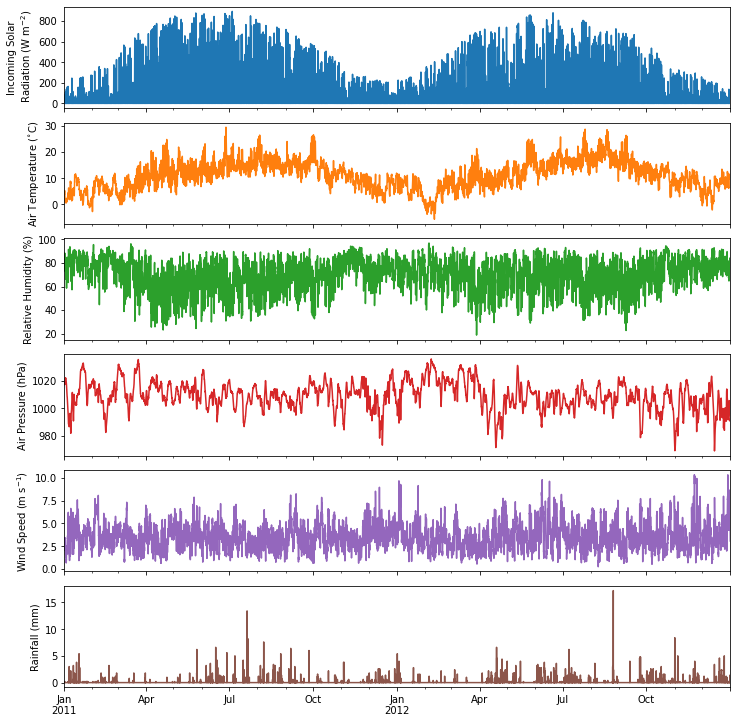

In [3]:
# %% Sample Data Metological Conditions

df_plot_forcing_x = df_forcing_s.loc[:, list_var_forcing].copy().shift(
    -1).dropna(how='any')
df_plot_forcing = df_plot_forcing_x.resample('1h').mean()
df_plot_forcing['rain'] = df_plot_forcing_x['rain'].resample('1h').sum()
    
axes = df_plot_forcing.plot(
    subplots=True,
    figsize=(10, 12),
    legend=False,
)
fig = axes[0].figure
fig.tight_layout()
fig.autofmt_xdate(bottom=0.2, rotation=0, ha='center')
for ax, var in zip(axes, list_var_forcing):
    ax.set_ylabel(dict_var_label[var])

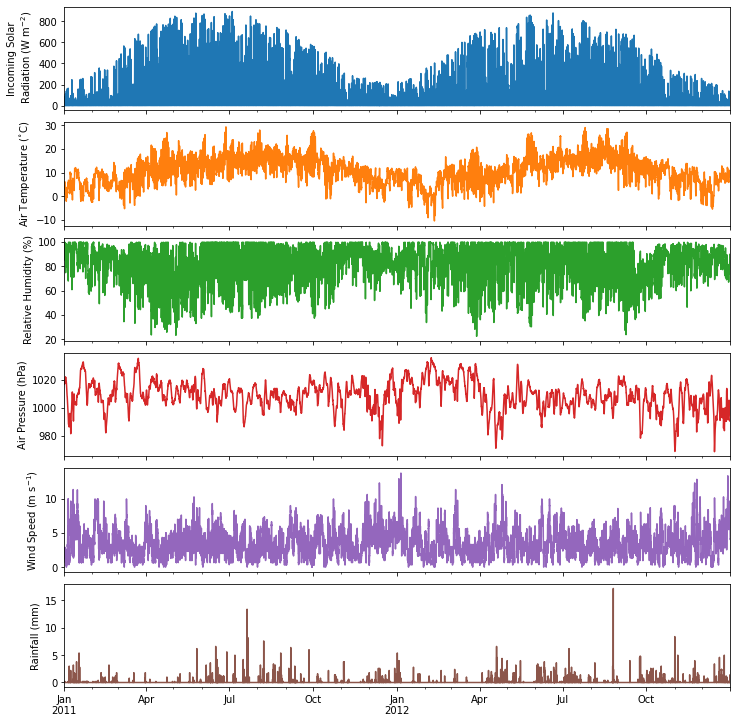

In [5]:
# %% Wisley Metological Conditions

df_plot_forcing_x = df_forcing_w.loc[:, list_var_forcing].copy().shift(
    -1).dropna(how='any')
df_plot_forcing = df_plot_forcing_x.resample('1h').mean()
df_plot_forcing['rain'] = df_plot_forcing_x['rain'].resample('1h').sum()

axes = df_plot_forcing.plot(
    subplots=True,
    figsize=(10, 12),
    legend=False,
)
fig = axes[0].figure
fig.tight_layout()
fig.autofmt_xdate(bottom=0.2, rotation=0, ha='center')
for ax, var in zip(axes, list_var_forcing):
    ax.set_ylabel(dict_var_label[var])

In [6]:
# %% Investigate Metreological conditions for London and Wisley
df_forcing_m = pd.concat([df_forcing_s, df_forcing_w],axis=1,join='inner',keys=['fKC','fWS']).swaplevel(0,1,axis=1)


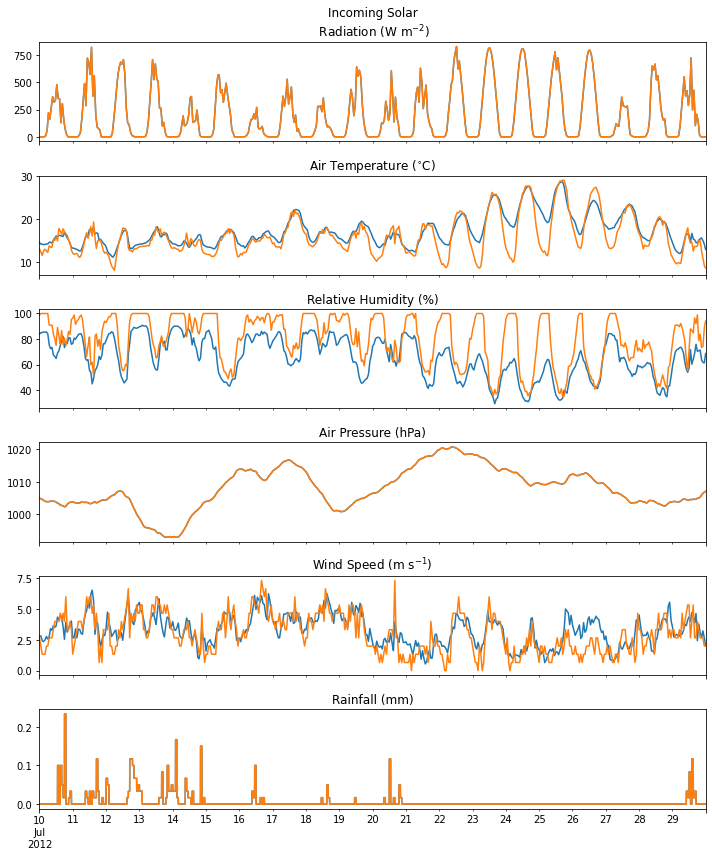

In [7]:
fsize=(10,12)
fig, axes = plt.subplots(6, 1, sharex=True)
s = '2012 07 10'
e = '2012 07 29'
a = df_forcing_m.loc[s : e ,'kdown'].plot(ax=axes[0],figsize=fsize,title= 'Incoming Solar\n Radiation ($ \mathrm{W \ m^{-2}}$)')
b = df_forcing_m.loc[s : e ,'Tair'].plot(ax=axes[1],figsize=fsize,title='Air Temperature ($^{\circ}}$C)')
c = df_forcing_m.loc[s : e ,'RH'].plot(ax=axes[2],figsize=fsize,title='Relative Humidity (%)')
d = df_forcing_m.loc[s : e ,'pres'].plot(ax=axes[3],figsize=fsize,title='Air Pressure (hPa)')
e1= df_forcing_m.loc[s : e ,'U'].plot(ax=axes[4],figsize=fsize,title='Wind Speed (m $\mathrm{s^{-1}}$)')
f = df_forcing_m.loc[s : e ,'rain'].plot(ax=axes[5],figsize=fsize,title='Rainfall (mm)')
for var in [a,b,c,d,e1,f]:
    figsize=fsize
    #night(var,df_forcing_s,s,e)
    var.get_legend().remove()
fig.tight_layout()

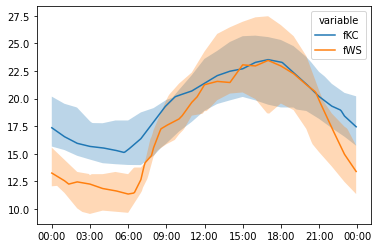

In [8]:
# %% June Tair Sample Data
s = '2012 07 21'
e = '2012 07 29'
ax = sp.util.plot_day_clm(df_forcing_m.loc[s:e,'Tair'])

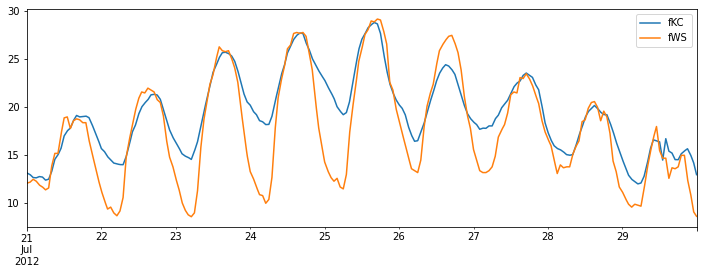

In [9]:
# %% June Tair Wisley Data 
ax_output = df_forcing_m.loc[s:e,'Tair'].plot(figsize=(12,4))

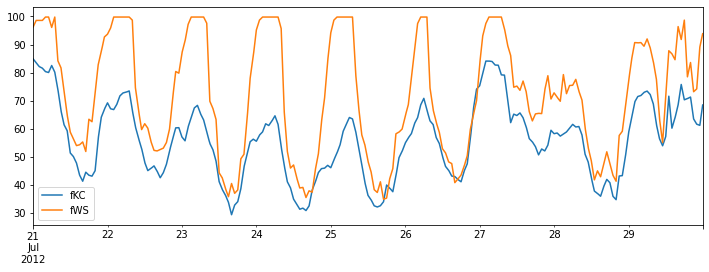

In [10]:
# %%  RH Selected days comparison
ax_output = df_forcing_m.loc[s:e,'RH'].plot(figsize=(12,4))

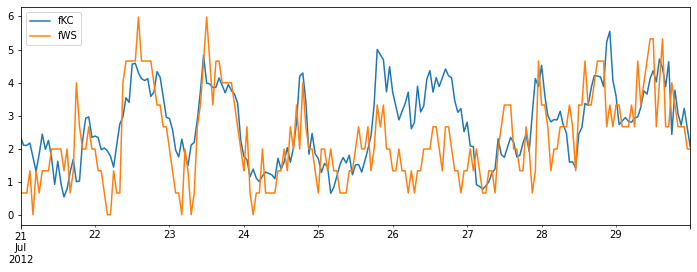

In [11]:
# %%  U Selected days comparison
ax_output = df_forcing_m.loc[s:e,'U'].plot(figsize=(12,4))

# Scenarios used 

## Run SuPy

In [12]:

# fKC_sKC
df_output_s, df_state_final_s = sp.run_supy(df_forcing_s, df_state_init_s)

# fWS_sWS
df_output_w, df_state_final_w = sp.run_supy(df_forcing_w, df_state_init_w)
 
# fWS_sKC
df_output_wu, df_state_final_wu = sp.run_supy(df_forcing_wu, df_state_init_wu)

df_forcing_merge_x=pd.concat([df_forcing_s, df_forcing_wu,df_forcing_w],axis=1,join='inner',keys=['fKC_sKC','fWS_sKC','fWS_sWS']).swaplevel(0,1,axis=1).sort_index(axis=1)

df_state_merge_x=pd.concat([df_state_init_s, df_state_init_wu,df_state_init_w],axis=1,join='inner',keys=['fKC_sKC','fWS_sKC','fWS_sWS']).swaplevel(0,1,axis=1).sort_index(axis=1)

df_output_merge_x=df_output_merge_x=pd.concat([df_output_s, df_output_wu,df_output_w],axis=1,join='inner',keys=['fKC_sKC','fWS_sKC','fWS_sWS']).swaplevel(0,-1,axis=1).swaplevel(0,1,axis=1).sort_index(axis=1).loc[grid_s]

df_merge_x=df_output_merge_x.SUEWS

# add available energy, AE
df_merge_x=df_merge_x.stack().eval('AE=QN+QF-QS').unstack()

2021-02-18 12:15:39,142 - SuPy - INFO - ====================
2021-02-18 12:15:39,143 - SuPy - INFO - Simulation period:
2021-02-18 12:15:39,143 - SuPy - INFO -   Start: 2011-01-01 00:05:00
2021-02-18 12:15:39,144 - SuPy - INFO -   End: 2013-01-01 00:00:00
2021-02-18 12:15:39,145 - SuPy - INFO - 
2021-02-18 12:15:39,145 - SuPy - INFO - No. of grids: 1
2021-02-18 12:15:39,146 - SuPy - INFO - SuPy is running in serial mode
2021-02-18 12:16:27,950 - SuPy - INFO - Execution time: 48.8 s
2021-02-18 12:16:27,951 - SuPy - INFO - ====================

2021-02-18 12:16:27,951 - SuPy - INFO - ====================
2021-02-18 12:16:27,952 - SuPy - INFO - Simulation period:
2021-02-18 12:16:27,953 - SuPy - INFO -   Start: 2011-01-01 00:05:00
2021-02-18 12:16:27,953 - SuPy - INFO -   End: 2013-01-01 00:00:00
2021-02-18 12:16:27,954 - SuPy - INFO - 
2021-02-18 12:16:27,954 - SuPy - INFO - No. of grids: 1
2021-02-18 12:16:27,955 - SuPy - INFO - SuPy is running in serial mode
2021-02-18 12:18:40,095 - S

In [13]:
df_output_w_old = pd.read_csv("C:\Script\SuPy\src\supy\sample_run\pre_stab_out\df_output_w_feb4.txt", sep ="\t")
df_output_w_old['datetime']= pd.to_datetime(df_output_w_old['datetime'])
df_output_w_old = df_output_w_old.set_index('datetime')

df_output_w_m = pd.concat([df_output_w.SUEWS.loc[grid_w], df_output_w_old],axis = 1,join='inner',keys=['fWS_sWS','fWS_sWS_OLD']).swaplevel(0,-1,axis=1)


In [60]:
df_soiltemp_2011 = pd.read_csv('C:\Script\SuPy\wisley_midas\soilt\soil_temp2011.txt', delimiter='\t', usecols=('ob_time','q10cm_soil_temp'))
df_soiltemp_2012 = pd.read_csv('C:\Script\SuPy\wisley_midas\soilt\soil_temp2012.txt', delimiter='\t', usecols=('ob_time','q10cm_soil_temp'))
df_soiltemp_2011=df_soiltemp_2011[:-1]
df_soiltemp_2011=df_soiltemp_2012[:-1]

soil_df_list = [df_soiltemp_2011, df_soiltemp_2012]

for i in soil_df_list:
    i = i[:-1]
    i['ob_time'] = pd.to_datetime(i['ob_time'])
    i=i.set_index('ob_time')

df_soiltemp_m = pd.concat([df_soiltemp_2011,df_soiltemp_2012])
df_soiltemp_m['ob_time'] = pd.to_datetime(df_soiltemp_m['ob_time'])
df_soiltemp_m = df_soiltemp_m.set_index('ob_time')
#df_soiltemp_m.to_csv('C:\Script\SuPy\wisley_midas\soilt\soil_temp_wisley_hourly.txt', sep ="\t",index=True, na_rep = 'NaN')


,q10cm_soil_temp
ob_time,
2012-01-02 12:00:00,5.3
2012-01-02 13:00:00,5.8
2012-01-02 14:00:00,6.1
2012-01-02 15:00:00,6.3
2012-01-02 16:00:00,6.1
...,...
2012-12-31 10:00:00,8.0
2012-12-31 11:00:00,8.1
2012-12-31 12:00:00,8.2


In [15]:

df_day_grasstemp_2011 = pd.read_csv('C:\Script\SuPy\wisley_midas\soilt\day_soil_temp2011.txt', delimiter=',',skiprows=90, usecols= ('ob_end_time', 'min_grss_temp'))
df_day_grasstemp_2011=df_day_grasstemp_2011[:-1]
df_day_grasstemp_2011['ob_end_time'] = pd.to_datetime(df_day_grasstemp_2011['ob_end_time'])
df_day_grasstemp_2011=df_day_grasstemp_2011.set_index('ob_end_time')
df_day_grasstemp_2011 = df_day_grasstemp_2011.dropna(how='all')

df_day_grasstemp_2012 = pd.read_csv('C:\Script\SuPy\wisley_midas\soilt\day_soil_temp2012.txt', delimiter="\t",skiprows=90,usecols= ('ob_end_time', 'min_grss_temp'))
df_day_grasstemp_2012=df_day_grasstemp_2012[:-1]
df_day_grasstemp_2012['ob_end_time'] = pd.to_datetime(df_day_grasstemp_2012['ob_end_time'])
df_day_grasstemp_2012=df_day_grasstemp_2012.set_index('ob_end_time')
df_day_grasstemp_2012 = df_day_grasstemp_2012.dropna(how='all')

df_day_grasstemp_m = pd.concat([df_day_grasstemp_2011,df_day_grasstemp_2012])

#df_day_grasstemp_m.to_csv('C:\Script\SuPy\wisley_midas\soilt\min_grass_temp_wisley_daily.txt', sep ="\t",index=True, na_rep = 'NaN')



In [16]:
# Start and end date for comparison
s = '2012 07 22'
e = '2012 07 29'

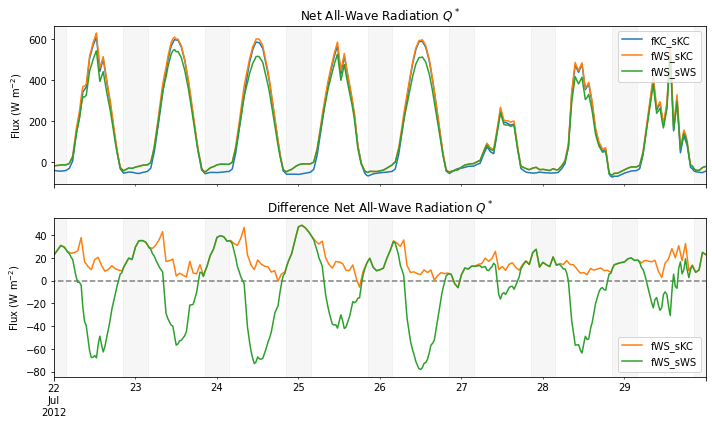

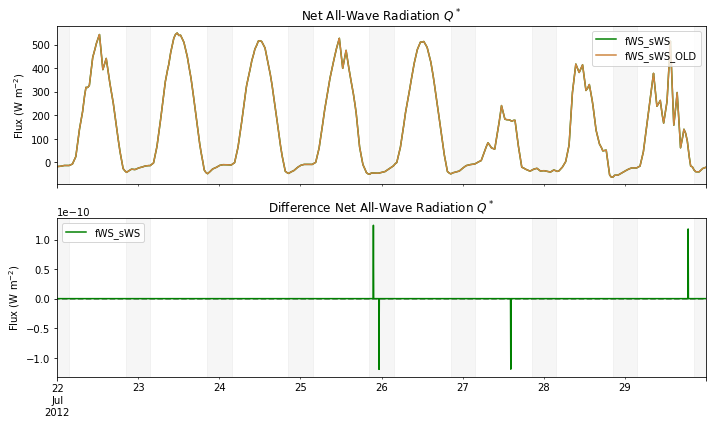

In [35]:
# %% Net All Wave Radiation
var = 'QN'
supy_plot(var, df_merge_x,s,e)
supy_plot_w(var, df_output_w_m,s,e)

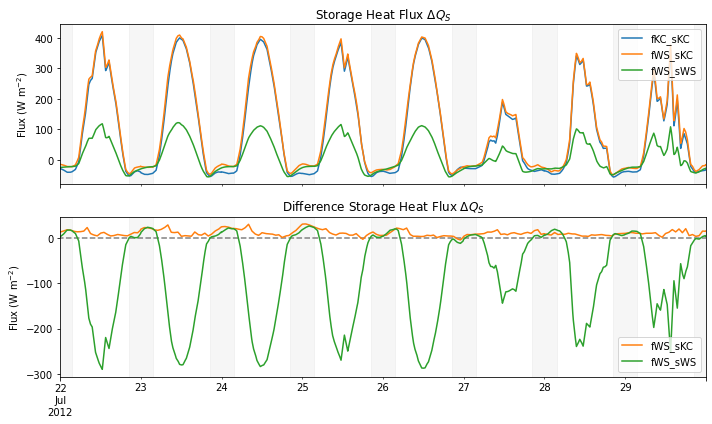

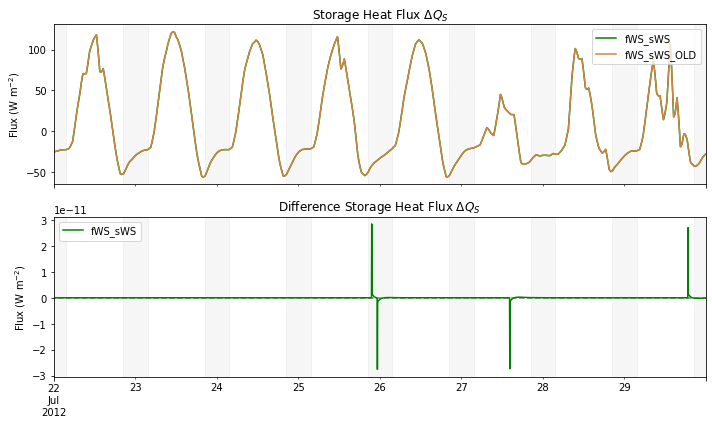

In [34]:
# %% Storage Heat Flux
var = 'QS'
supy_plot(var, df_merge_x,s,e)
supy_plot_w(var, df_output_w_m,s,e)

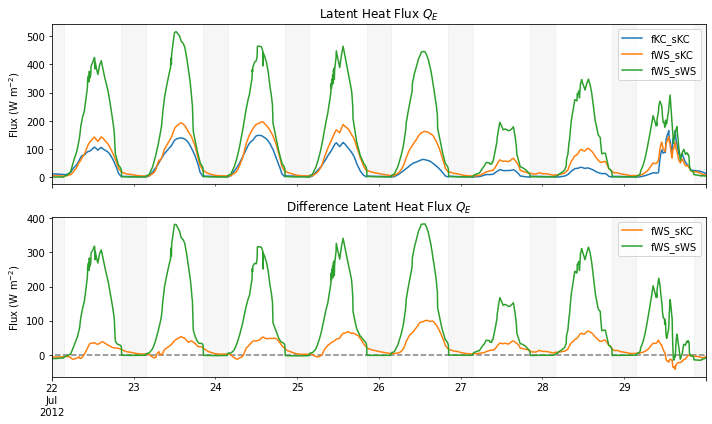

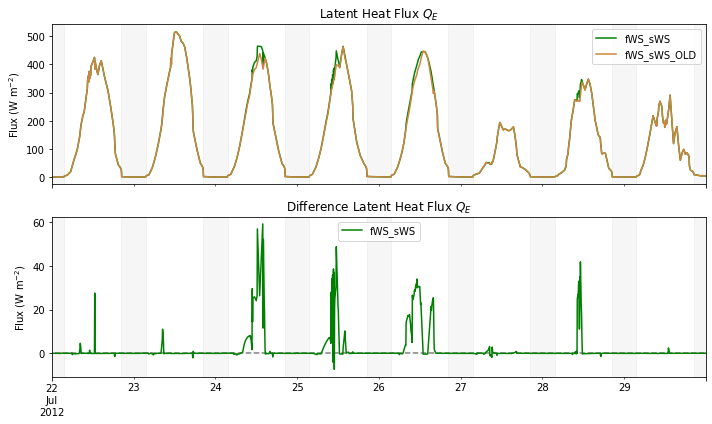

In [33]:
# Latent Heat Flux
var = 'QE'
supy_plot(var, df_merge_x,s,e)
supy_plot_w(var, df_output_w_m,s,e)

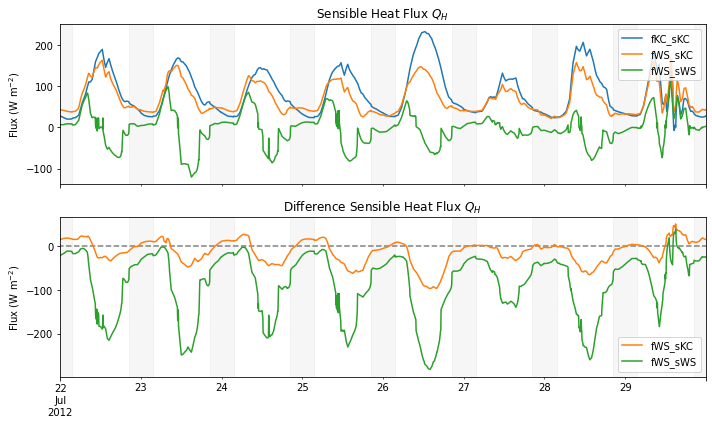

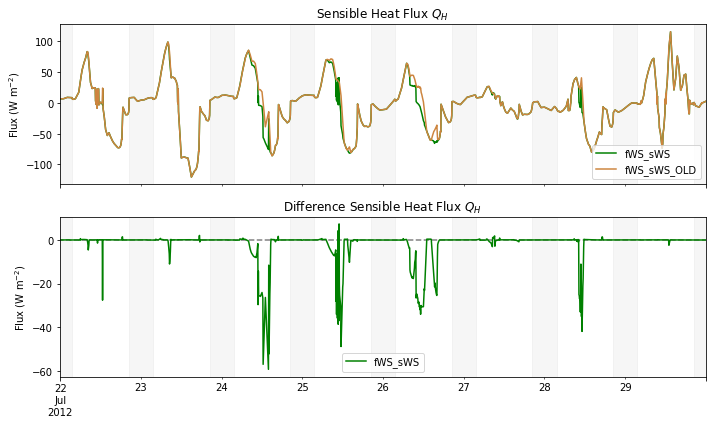

In [36]:
# Sensible Heat Flux
var = 'QH'
supy_plot(var, df_merge_x,s,e)
supy_plot_w(var, df_output_w_m,s,e)

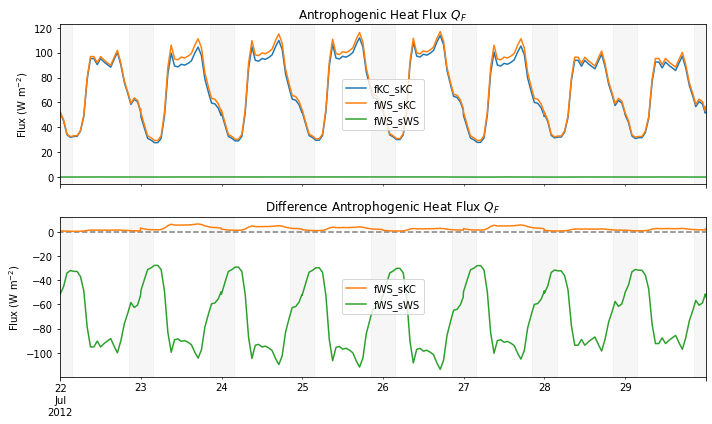

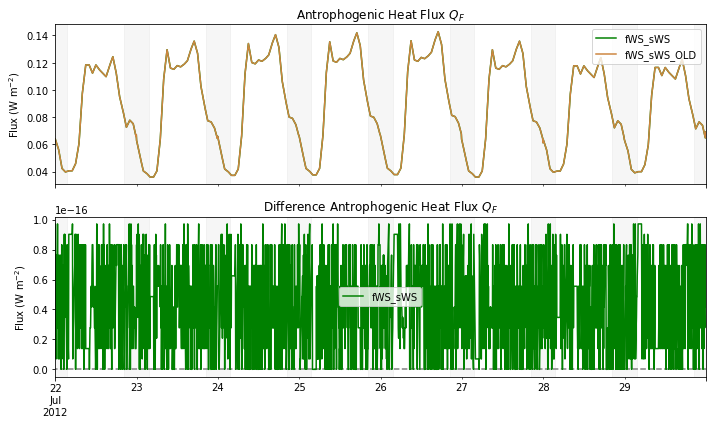

In [38]:
# %%% Anthropogenic Heat flux
supy_plot('QF', df_merge_x,s,e)
supy_plot_w('QF', df_output_w_m,s,e)

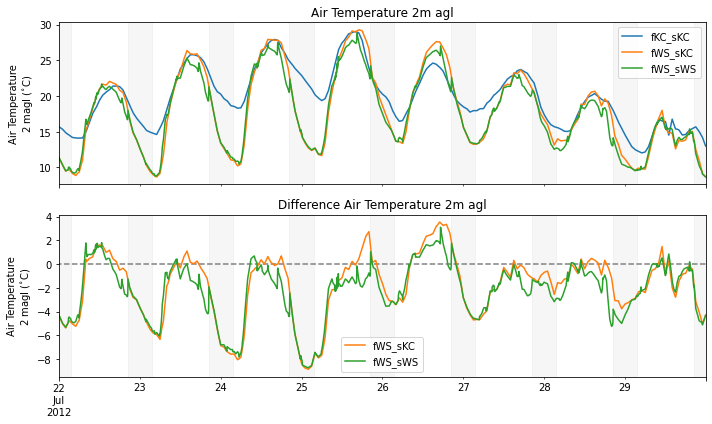

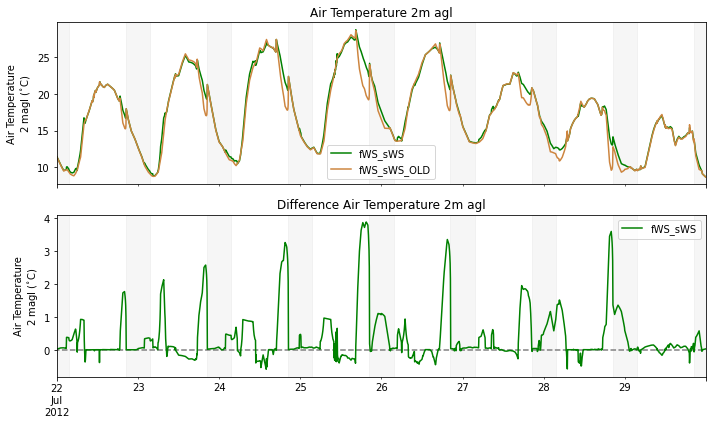

In [40]:
supy_plot('T2', df_merge_x,s,e)
supy_plot_w('T2', df_output_w_m,s,e)

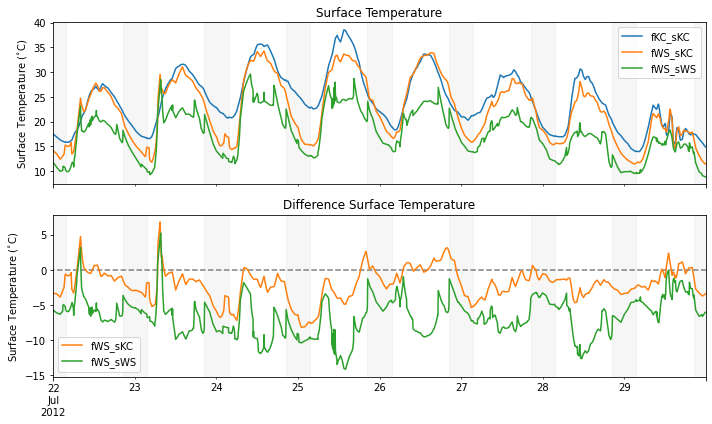

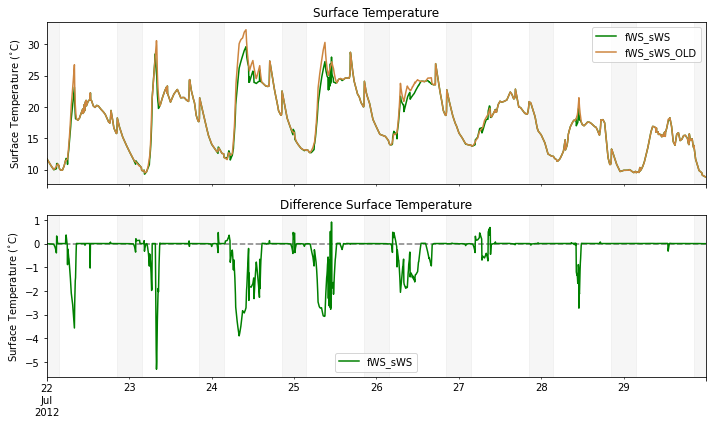

In [41]:
supy_plot('Ts', df_merge_x,s,e)
supy_plot_w('Ts', df_output_w_m,s,e)

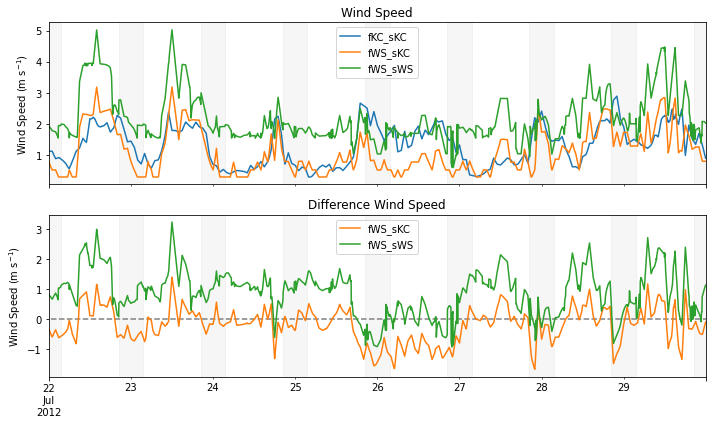

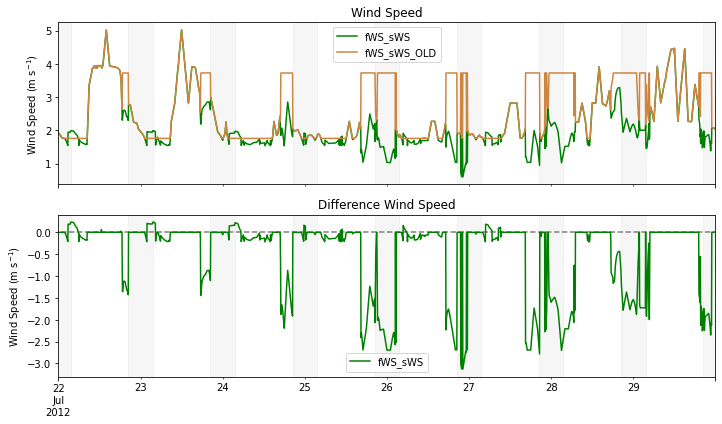

In [42]:
# %% Wind Speed 10m
supy_plot('U10', df_merge_x,s,e)
supy_plot_w('U10', df_output_w_m,s,e)

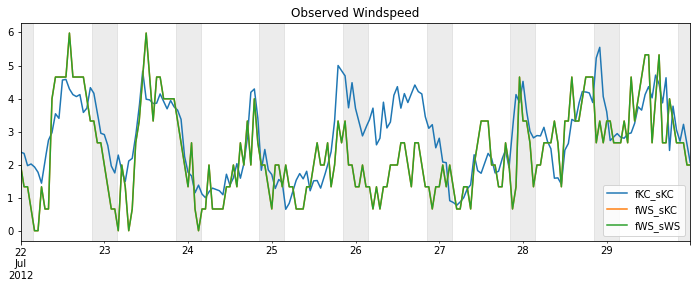

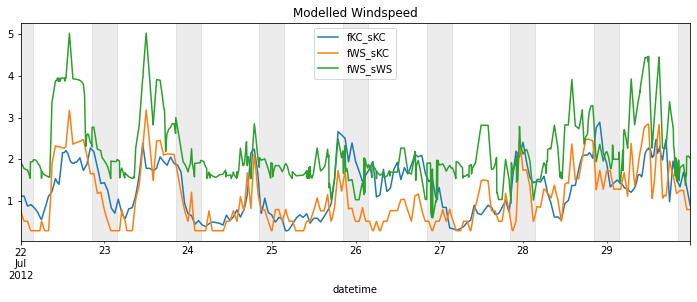

In [25]:
# %%  U Selected days comparison
ax_output = df_forcing_merge_x.loc[s:e,'U'].plot(figsize=(12,4),title ='Observed Windspeed')
night(ax_output,df_merge_x,s,e,s_alpha=0.15)
ax_output = df_merge_x.loc[s:e,'U10'].plot(figsize=(12,4), title = 'Modelled Windspeed')
night(ax_output,df_merge_x,s,e,s_alpha=0.15)



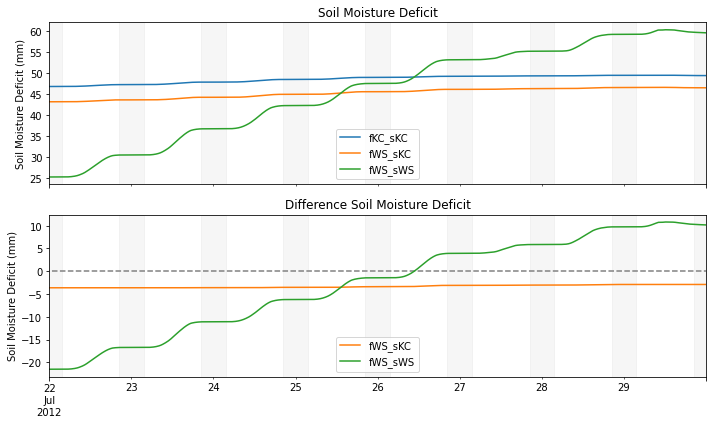

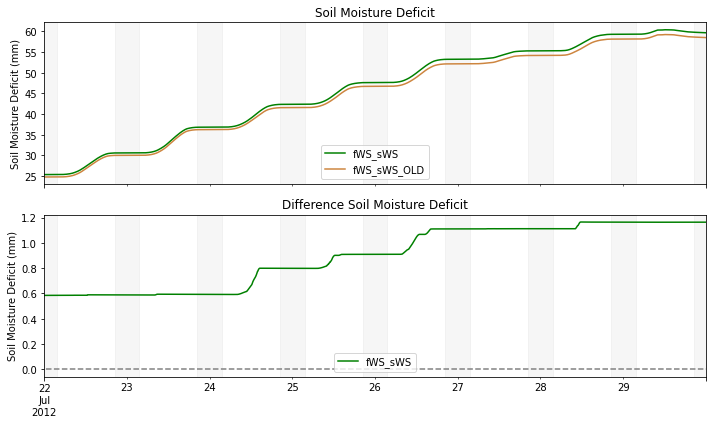

In [44]:
# %% Soil Moisture Deficit
supy_plot('SMD', df_merge_x,s,e)
supy_plot_w('SMD', df_output_w_m,s,e)

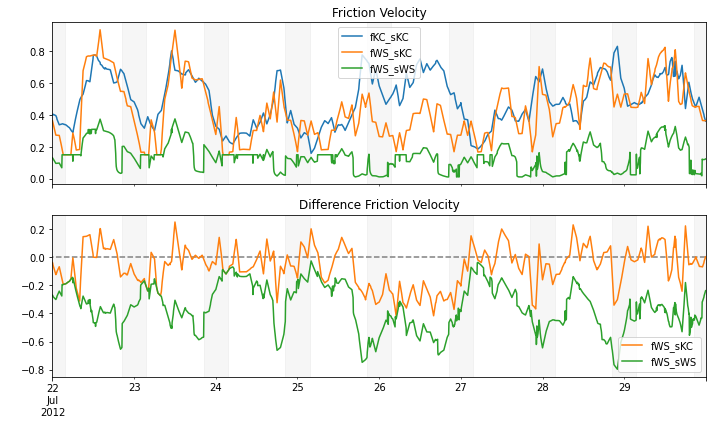

In [27]:
supy_plot('UStar', df_merge_x,s,e)

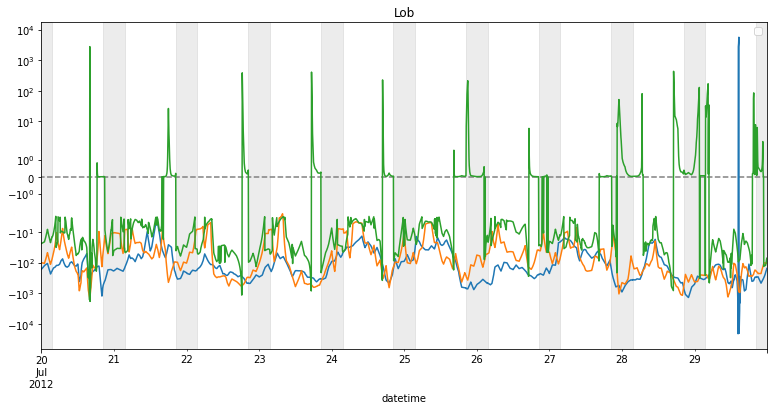

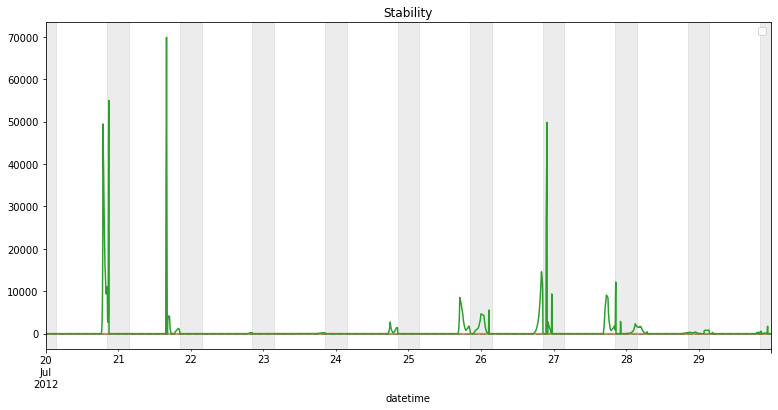

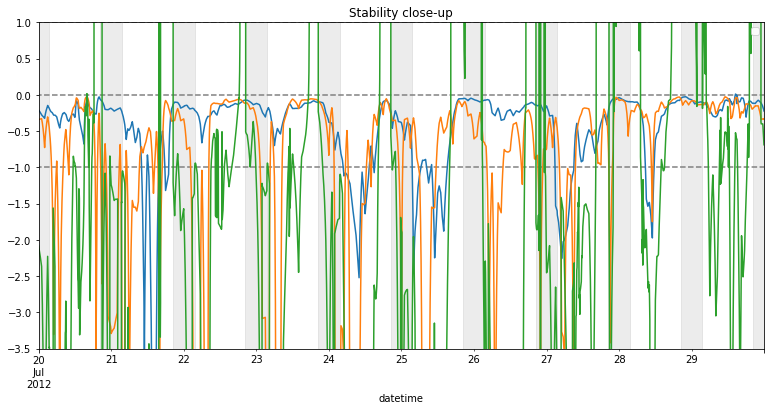

In [73]:
s = '2012 07 20'
e = '2012 07 29'
from supy_plot import zeroline
ax = df_merge_x.loc[s:e,'Lob'].plot(figsize=(13,6),title='Lob')
ax.set_yscale('symlog')
#ax.set_ylim([-3.5,0.5])
night(ax,df_merge_x,s,e,s_alpha=0.15)
zeroline(s,e)
plt.legend('')

ax = pd.DataFrame((49.1-df_merge_x['zdm'])/df_merge_x['Lob']).loc[s:e].plot(figsize=(13,6),title='Stability')
night(ax,df_merge_x,s,e,s_alpha=0.15)
#ax.set_ylim([-10.10,10])
plt.legend('')
for i in (1, 0, -1.1):
    zeroline(s,e,i)


ax = pd.DataFrame((49.1-df_merge_x['zdm'])/df_merge_x['Lob']).loc[s:e].plot(figsize=(13,6),title='Stability close-up')
ax.set_ylim([-3.5,1])
night(ax,df_merge_x,s,e,s_alpha=0.15)
plt.legend('')
for i in (1, 0, -1):
    zeroline(s,e,i)


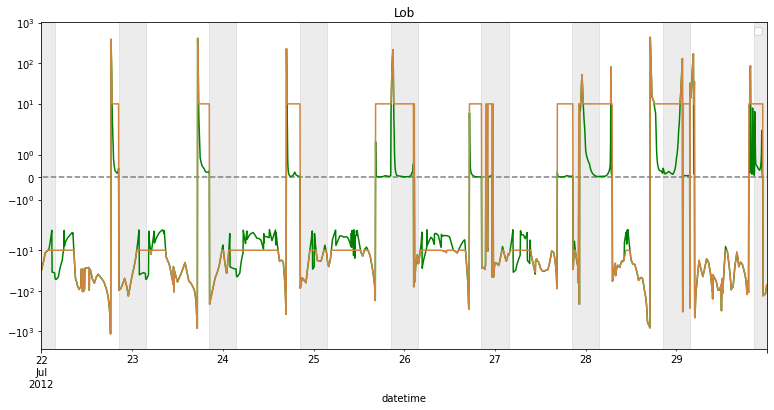

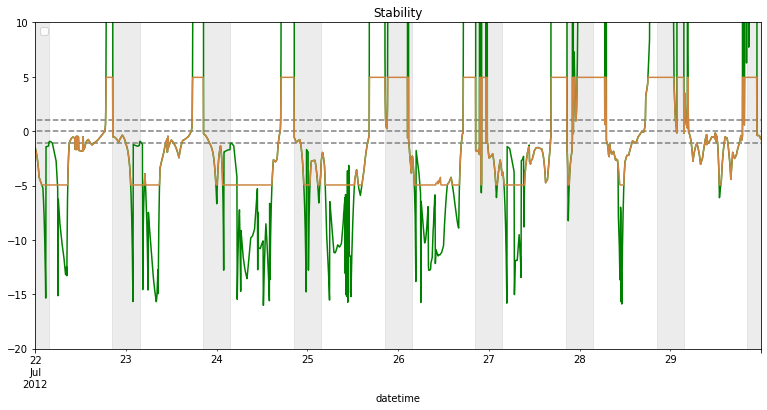

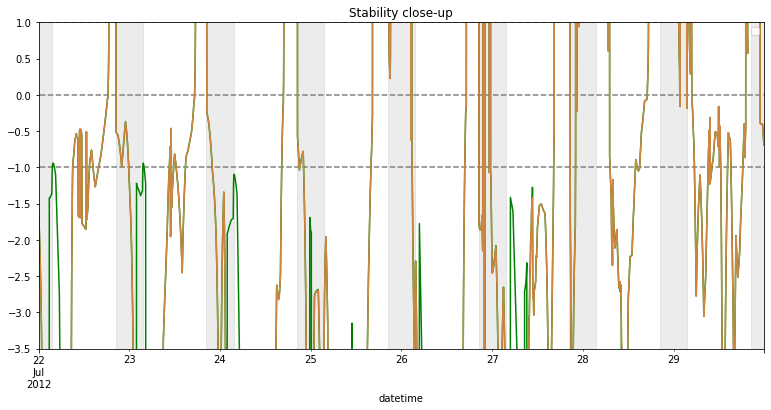

In [46]:
from supy_plot import stab_plot
stab_plot(df_output_w_m,s,e,ylimb=[-20, 10])

In [48]:
ax = df_soiltemp_m.loc[s:e].plot(figsize=(13,6),title='Soil temperature 10cm Wisley')
ax.set_ylabel('C°')

night(ax,df_merge_x,s,e,s_alpha=0.15)
plt.legend('');

KeyError: '2012 07 22'

In [ ]:
ax = df_day_grasstemp_m.loc[s:e].plot(figsize=(13,6),title='Min grass temperature Wisley')
ax.set_ylabel('C°')
ax.set_xlabel('Date')

night(ax,df_merge_x,s,e,s_alpha=0.15)
plt.legend('');

## large QE at Wisley: why?

In [28]:
df_state_merge_x[['z0m_in', 'zdm_in']]

var      z0m_in                  zdm_in                
        fKC_sKC fWS_sKC fWS_sWS fKC_sKC fWS_sKC fWS_sWS
ind_dim       0       0       0       0       0       0
grid                                                   
1           1.9     1.9    0.03    14.2    14.2     0.1

In [29]:
df_sfr=df_state_merge_x.sfr.stack()
df_sfr.index=['Bldgs','Paved','DecTr','EveTr','Grass','BSoil','Water']
df_sfr

,fKC_sKC,fWS_sKC,fWS_sWS
Bldgs,0.43,0.43,0.001
Paved,0.38,0.38,0.002
DecTr,0.00,0.00,0.010
EveTr,0.02,0.02,0.050
Grass,0.03,0.03,0.927
BSoil,0.00,0.00,0.010
Water,0.14,0.14,0.000


In [30]:
print(df_sfr.to_markdown())

|       |   fKC_sKC |   fWS_sKC |   fWS_sWS |
|:------|----------:|----------:|----------:|
| Bldgs |      0.43 |      0.43 |     0.001 |
| Paved |      0.38 |      0.38 |     0.002 |
| DecTr |      0    |      0    |     0.01  |
| EveTr |      0.02 |      0.02 |     0.05  |
| Grass |      0.03 |      0.03 |     0.927 |
| BSoil |      0    |      0    |     0.01  |
| Water |      0.14 |      0.14 |     0     |


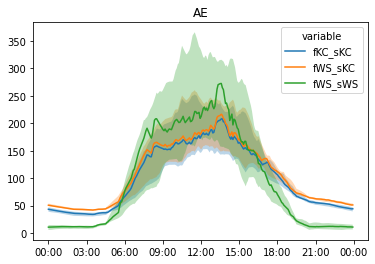

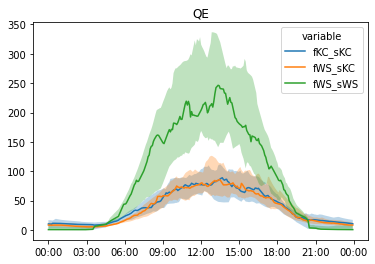

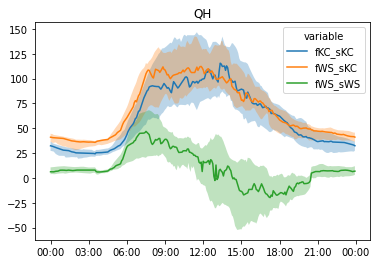

In [36]:

for var in ['AE','QE','QH']:
    fig,ax=sp.util.plot_day_clm(df_merge_x.loc['2012 7',var])
    _=ax.set_title(var)

## T2 issue

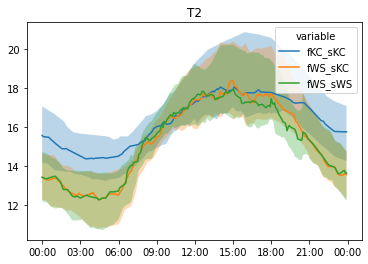

In [32]:
fig,ax=sp.util.plot_day_clm(df_merge_x.T2.loc['2012 7'])
_=ax.set_title('T2')

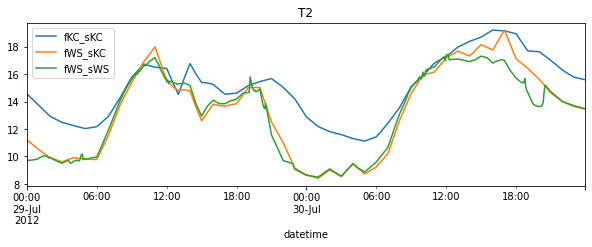

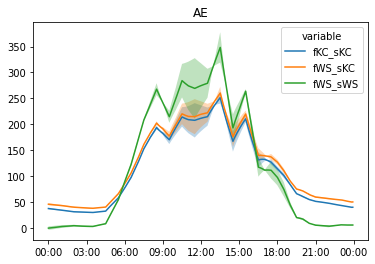

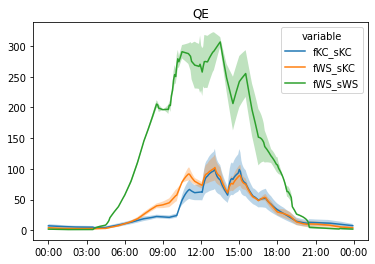

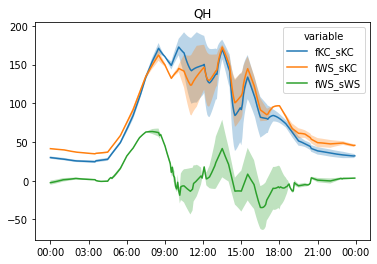

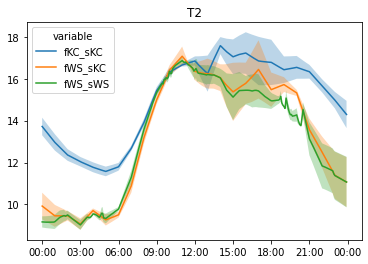

In [33]:
df_merge_x.loc[s:e,'T2'].plot(figsize=[10,3],title='T2')

for var in ['AE','QE','QH','T2']:
    fig,ax=sp.util.plot_day_clm(df_merge_x.loc[s:e,var])
    _=ax.set_title(var)

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

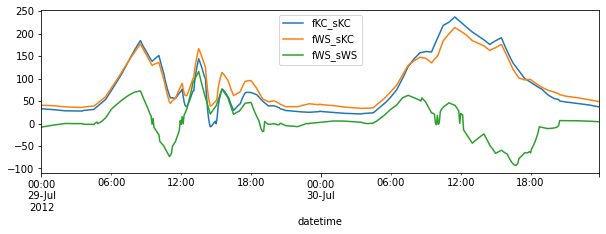

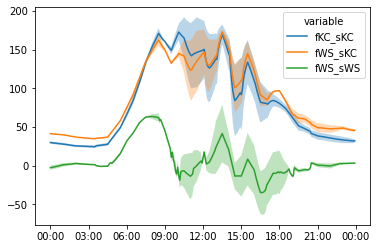

In [34]:
df_merge_x.loc[s:e,'QH'].plot(figsize=[10,3])
sp.util.plot_day_clm(df_merge_x.loc[s:e,'QH'])

In [35]:
df_x=df_merge_x.loc[s:e,['QH','T2']].stack(0).iloc[:,1:].unstack(1).swaplevel(axis=1).sort_index(axis=1)
idx=df_x.loc['2012 7 23','QH'].query('fWS_sWS>0').index
df_x.loc['2012 7 23','T2'].loc[idx].plot()

KeyError: '2012 7 23'

<AxesSubplot:title={'center':'dif_T2'}, xlabel='flag_QH'>

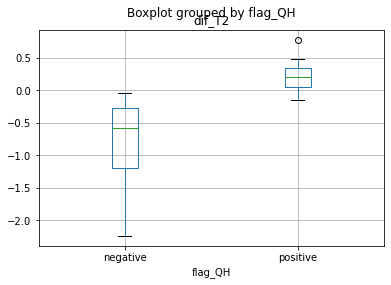

In [57]:
df_x=df_merge_x.loc[s:e,'QH']
flag_QH=df_x.fWS_sWS.where(df_x.fWS_sWS>0,False).astype(bool)
df_x=df_merge_x.loc[s:e,'T2'].diff(axis=1).assign(flag_QH=flag_QH.replace({True:'positive',False:'negative'}))
df_x.melt(id_vars='flag_QH',value_vars=['fWS_sWS'],value_name=r'dif_T2').boxplot(column=r'dif_T2',by='flag_QH')

<AxesSubplot:>

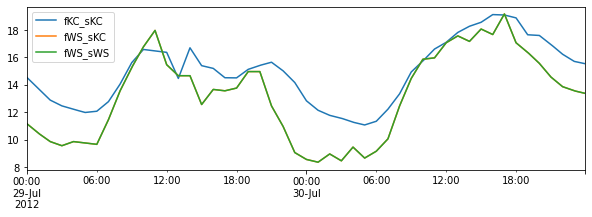

In [58]:
df_forcing_merge_x.loc[s:e,'Tair'].plot(figsize=[10,3])

In [59]:
df_T_RSL=df_output_merge_x.RSL.filter(like='T_').loc[s:e].stack().drop_prefix('T_').sort_index(axis=1,key=pd.to_numeric).unstack()


AttributeError: 'DataFrame' object has no attribute 'drop_prefix'

In [60]:
df_T_RSL.loc[:,'1'].plot(figsize=[10,3])
df_T_RSL.loc[:,'15'].plot(figsize=[10,3])
df_T_RSL.loc[:,'30'].plot(figsize=[10,3])

NameError: name 'df_T_RSL' is not defined

In [30]:
df_output_merge_x.RSL.stack().columns.to_list();

In [61]:
df_output_merge_x.RSL.flag_RSL

,fKC_sKC,fWS_sKC,fWS_sWS
datetime,,,
2011-01-01 00:05:00,1.0,1.0,0.0
2011-01-01 00:10:00,1.0,1.0,0.0
2011-01-01 00:15:00,1.0,1.0,0.0
2011-01-01 00:20:00,1.0,1.0,0.0
2011-01-01 00:25:00,1.0,1.0,0.0
...,...,...,...
2012-12-31 23:40:00,1.0,1.0,0.0
2012-12-31 23:45:00,1.0,1.0,0.0
2012-12-31 23:50:00,1.0,1.0,0.0


In [10]:
sp.save_supy(df_output_s, df_state_final_s, path_runcontrol=path_runcontrol_s)
sp.save_supy(df_output_w, df_state_final_w, path_runcontrol=path_runcontrol_w)
sp.save_supy(df_output_wu, df_state_final_wu, path_runcontrol=path_runcontrol_wu)

[WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2011_DailyState.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2012_DailyState.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2011_RSL_60.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2012_RSL_60.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2011_SOLWEIG_60.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2012_SOLWEIG_60.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2011_SUEWS_60.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2012_SUEWS_60.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2011_snow_60.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/Wu1_2012_snow_60.txt'),
 WindowsPath('C:/Script/SuPy/src/supy/sample_run/Output/InitialConditionsWu1_2013_EndofRun.nml')]